---
## **Plotando a Primeira Imagem de Satélite**
---

**OBJETIVO:** Nesta aula prática aprenderemos como plotar as imagens do **visível**, **vapor d'água** e também do **infravermelho**. Para isto usaremos os dados do sensor [Advanced Baseline Imager (ABI)](https://space.oscar.wmo.int/instruments/view/abi) do satélite [Geostationary Operational Environmental Satellite (GOES-16)](https://space.oscar.wmo.int/satellites/view/goes_16).

---


**DADOS DE ENTRADA**: Arquivos de temperatura de brilho dos canais **visível**, **vapor d'água** e **infravermelho**

1. $\underline{Visível}$: CH02 - 0.64 µm
- **Tipo do dado:** matriz de 6262 linhas x 6262 colunas  
- **Formato do dado:** arquivo NETCDF
- **Nome do arquivo:** S10635334_202001231200.nc
- **Fonte dos dados:** FTP do [CPTEC/INPE](http://ftp.cptec.inpe.br/goes/goes16/retangular/goes16/retangular/ch02/)

    ----------

2. $\underline{Vapor\ d'água}$: CH08 - 6.15 µm
- **Tipo do dado:** matriz de 3131 linhas x 3131 colunas  
- **Formato do dado:** arquivo NETCDF
- **Nome do arquivo:** S10635340_202001231200.nc
- **Fonte dos dados:** FTP do [CPTEC/INPE](http://ftp.cptec.inpe.br/goes/goes16/retangular/goes16/retangular/ch08/)

    ----------

3. $\underline{Infravermelho}$: CH13 - 10.35 µm
- **Tipo do dado:** matriz de 3131 linhas x 3131 colunas  
- **Formato do dado:** arquivo NETCDF
- **Nome do arquivo:** S10635346_202001231200.nc
- **Fonte dos dados:** FTP do [CPTEC/INPE](http://ftp.cptec.inpe.br/goes/goes16/retangular/goes16/retangular/ch13/)

---

**DADOS DE SAÍDA:** Figuras de temperatura de brilho.
- **Tipo do dado:** Figura
- **Formato do dado:** arquivos JPG
- **Imagens geradas:**
    1. parte_2_goes16_ch13_20200123_1700.jpg
    2. parte_2_goes16_ch02_20200123_1700.jpg
    3. parte_2_goes16_ch08_20200123_1700.jpg
    4. parte_2_painel.png

---

**PROCEDIMENTO REALIZADO:** Os seguintes procedimentos são realizados nesse código:
1.   Instalação de bibliotecas
2.   Monta o google drive
3.   Define o caminho do google drive
4.   Importação das bibliotecas
5.   Carrega o GeoBR
6.   Baixa os dados de satélite
7.   Plota imagem do infravermelho
8.   Plota imagem do visível
9.   Plota imagem do vapor d'água
10.  Plota imagens em forma de painel


---
**OBSERVAÇÕES IMPORTANTES**:
1. Caminho do seu drive

---
- **Realizado por:** Enrique V. Mattos - 23/08/2022
- **Atualizado por:** Enrique V. Mattos - 04/07/2023


---

# **1° Passo:** Instalando as bibliotecas

In [ ]:
# Instalando o proplot (usado para gerar Mapas também)
!pip install -q proplot

# Instalando o cartopy (usado para gerar Mapas)
!pip uninstall shapely --yes
!pip install -q shapely cartopy --no-binary shapely --no-binary cartopy
!wget https://raw.githubusercontent.com/SciTools/cartopy/master/tools/cartopy_feature_download.py
!python cartopy_feature_download.py physical

Chegando aqui, será necessário fazer a tediosa **Reinicialização do Ambiente de Execução** (acessar *Ambiente de execução* que esta na barra de ferramentas e clicar em *Reiniciar Ambiente de Execução* e rodar novamente a célula anterior de instalações) e ter que instalar todos os pacotes de novo. Isso é necessário tanto para poder usar sem problemas o `Proplot` quanto o `CartoPy` na nossa sessão do Colab, então a partir desse ponto não teremos mais que nos preocupar com a preparação do ambiente virtual.

In [7]:
# Instalando o Salem (usado para mascarar regiões)
!pip install -q rasterio
!pip install -q pyproj
!pip install -q geopandas
!pip install -q salem

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 57.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 45.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 41.3 MB/s eta 0:00:00


# **2° Passo:** Montando drive

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **3° Passo:** Caminho do diretório
- Insira aqui o caminho da pasta do seu Google Drive onde esta o código dessa aula.

In [9]:
dir = '/content/drive/MyDrive/PYHTON/00_GITHUB/4_SATELITE/'

# **4° Passo:** Importando as bibliotecas

In [10]:
import numpy as np
import proplot as pplt
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import glob
import matplotlib
from matplotlib.colors import LinearSegmentedColormap # interpolação linear para as cores dos mapas
from matplotlib import cm                             # Colormap handling utilities
import os
from tqdm.notebook import tqdm_notebook
import imageio
import xarray as xr
import salem

import sys
sys.path.append(f'{dir}input/')
from cpt_convert import loadCPT

import warnings
warnings.filterwarnings("ignore")

# **5° Passo:** Download shapefiles do IBGE

In [11]:
# baixando e descomprimindo shapefiles dos estados do Brasil
print('------ BAIXANDO OS SHAPEFILES DE TODOS OS ESTADOS DO BRASIL ------')
!wget -c https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2019/Brasil/BR/br_unidades_da_federacao.zip
!unzip -o /content/br_unidades_da_federacao.zip

------ BAIXANDO OS SHAPEFILES DE TODOS OS ESTADOS DO BRASIL ------
--2023-07-05 14:08:03--  https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2019/Brasil/BR/br_unidades_da_federacao.zip
Resolving geoftp.ibge.gov.br (geoftp.ibge.gov.br)... 191.233.136.86
Connecting to geoftp.ibge.gov.br (geoftp.ibge.gov.br)|191.233.136.86|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  /content/br_unidades_da_federacao.zip
 extracting: BR_UF_2019.cpg          
  inflating: BR_UF_2019.dbf          
  inflating: BR_UF_2019.prj          
  inflating: BR_UF_2019.shp          
  inflating: BR_UF_2019.shx          


In [12]:
# lendo shapefile de todos estados brasileiros
estados_ibge = salem.read_shapefile('/content/BR_UF_2019.shp')
estados_ibge

,CD_UF,NM_UF,SIGLA_UF,NM_REGIAO,geometry,min_x,max_x,min_y,max_y
0,11,Rondônia,RO,Norte,"POLYGON ((-65.38150 -10.42907, -65.38013 -10.4...",-66.810253,-59.774357,-13.693700,-7.975868
1,12,Acre,AC,Norte,"POLYGON ((-71.07772 -9.82774, -71.07817 -9.828...",-73.990450,-66.623754,-11.145561,-7.111824
2,13,Amazonas,AM,Norte,"POLYGON ((-69.83766 -3.68659, -69.82555 -3.620...",-73.801558,-56.097558,-9.818046,2.246631
3,14,Roraima,RR,Norte,"POLYGON ((-63.96008 2.47313, -63.96041 2.47416...",-64.825254,-58.886884,-1.580633,5.271841
4,15,Pará,PA,Norte,"MULTIPOLYGON (((-51.43248 -0.47334, -51.42949 ...",-58.898328,-46.061425,-9.841153,2.591027
5,16,Amapá,AP,Norte,"MULTIPOLYGON (((-50.45011 2.10924, -50.44715 2...",-54.876250,-49.875682,-1.236176,4.508817
6,17,Tocantins,TO,Norte,"POLYGON ((-48.23163 -5.94614, -48.23011 -5.938...",-50.742064,-45.699265,-13.467713,-5.168381
7,21,Maranhão,MA,Nordeste,"MULTIPOLYGON (((-44.53830 -2.02124, -44.53742 ...",-48.755151,-41.795884,-10.261765,-1.049328
8,22,Piauí,PI,Nordeste,"POLYGON ((-42.91539 -6.64607, -42.91645 -6.644...",-46.028207,-40.370510,-10.928756,-2.749753
9,23,Ceará,CE,Nordeste,"POLYGON ((-41.18292 -4.01797, -41.18552 -4.017...",-41.423518,-37.252659,-7.858182,-2.784323


# **PARTE 0)**: Baixando os dados de satélite

---


- Olá pessoal. A ideia dessa aula é vocês baixarem os dados brutos de satélite direto da fonte. Assim, o primeiro passo será baixar os dados de satélite para os canais visível, infravermelho e vapor d'água para uma determinada data.
- Esses dados são fornecidos pela NOAA e reprocessados pela [Divisão de Satélites (DSA)](http://satelite.cptec.inpe.br/home/index.jsp) do CPTEC/INPE e estão disponíveis no [ftp](http://ftp.cptec.inpe.br/goes/goes16/retangular/) do INPE. Abaixo seguem informações sobres esses 3 canais:



---

1. [Visível](http://ftp.cptec.inpe.br/goes/goes16/retangular/ch02/): CH02 - 0.64 µm
2. [Vapor d'água](http://ftp.cptec.inpe.br/goes/goes16/retangular/ch08/): CH08 - 6.15 µm
3. [Infravermelho](http://ftp.cptec.inpe.br/goes/goes16/retangular/ch13/): CH13 - 10.35 µm

---








Abaixo precisaremos definir o **ano**, **mês**, **dia**, **hora** e **minuto** do dado que gostaríamos de gerar a imagem de satélite. **Lembre-se**: os dados do sensor **ABI** do satélite **GOES-16** possui resolução temporal de 10 min. Por exemplo: 00:00, 00:10, 00:20, ... No exemplo a seguir iremos baixar e gerar a imagem do dia **23 de janeiro de 2020 às 17 horas e 0 minutos**.

In [13]:
# defina a data/horário da imagem e o satélite
ano, mes, dia, hor, minu = '2020', '01', '23', '17', '00'

In [14]:
# endereço do FTP do CPTEC-INPE
ftp_cptec = 'http://ftp.cptec.inpe.br/goes/'

In [15]:
# montando os nomes dos arquivos. É o caminho onde estão os dados nop ftp do INPE.
file_vis = f'{ftp_cptec}goes16/retangular/ch02/{ano}/{mes}/S10635334_{ano}{mes}{dia}{hor}{minu}.nc'
file_ir =  f'{ftp_cptec}goes16/retangular/ch13/{ano}/{mes}/S10635346_{ano}{mes}{dia}{hor}{minu}.nc'
file_wv =  f'{ftp_cptec}goes16/retangular/ch08/{ano}/{mes}/S10635340_{ano}{mes}{dia}{hor}{minu}.nc'

In [16]:
# mostra os nomes dos arquivos
print(file_vis)
print(file_ir)
print(file_wv)

http://ftp.cptec.inpe.br/goes/goes16/retangular/ch02/2020/01/S10635334_202001231700.nc
http://ftp.cptec.inpe.br/goes/goes16/retangular/ch13/2020/01/S10635346_202001231700.nc
http://ftp.cptec.inpe.br/goes/goes16/retangular/ch08/2020/01/S10635340_202001231700.nc


In [17]:
# download dos arquivos
!wget -c {file_vis}
!wget -c {file_ir}
!wget -c {file_wv}

--2023-07-05 14:09:52--  http://ftp.cptec.inpe.br/goes/goes16/retangular/ch02/2020/01/S10635334_202001231700.nc
Resolving ftp.cptec.inpe.br (ftp.cptec.inpe.br)... 150.163.141.22
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.141.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 59727882 (57M) [application/x-netcdf]
Saving to: ‘S10635334_202001231700.nc’

S10635334_202001231 100%[===================>]  56.96M   613KB/s    in 86s     

2023-07-05 14:11:19 (675 KB/s) - ‘S10635334_202001231700.nc’ saved [59727882/59727882]

--2023-07-05 14:11:20--  http://ftp.cptec.inpe.br/goes/goes16/retangular/ch13/2020/01/S10635346_202001231700.nc
Resolving ftp.cptec.inpe.br (ftp.cptec.inpe.br)... 150.163.141.22
Connecting to ftp.cptec.inpe.br (ftp.cptec.inpe.br)|150.163.141.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13907580 (13M) [application/x-netcdf]
Saving to: ‘S10635346_202001231700.nc’

S10635346_202001231 100%[==============

Os dados foram baixados para a máquina virtual do Google, veja exemplo abaixo.

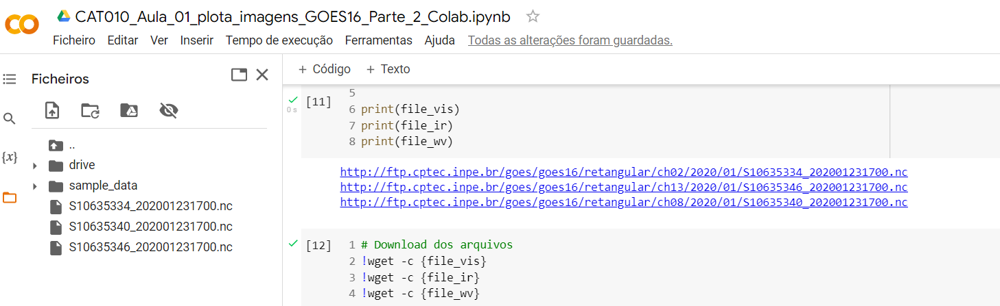

# **PARTE 1)**: Plota imagem do infravermelho

- **Extrai informações importantes da imagem**

In [27]:
# leitura do arquivo
imagem = xr.open_dataset(f'/content/S10635346_{ano}{mes}{dia}{hor}{minu}.nc')

In [28]:
# mostra os dados
imagem

<xarray.Dataset>
Dimensions:  (lat: 3131, lon: 3131)
Coordinates:
  * lat      (lat) float64 -55.99 -55.96 -55.93 -55.9 ... 34.9 34.93 34.96 34.99
  * lon      (lon) float64 -116.0 -116.0 -115.9 -115.9 ... -25.07 -25.04 -25.01
Data variables:
    Band1    (lat, lon) float64 ...
    crs      |S1 ...
Attributes:
    Conventions:  CF-1.5
    GDAL:         GDAL 2.2.2, released 2017/09/15
    history:      Thu Jan 23 17:15:10 2020: GDAL Create( /dados/output/goes16...

In [29]:
# extrai os limites das latitudes e longitudes
latmin, latmax, lonmin, lonmax = float(imagem['lat'][0]), float(imagem['lat'][-1]), float(imagem['lon'][0]), float(imagem['lon'][-1])

In [30]:
# divide por 100 e transforma para Celsius
imagem = (imagem['Band1']/100.)-273.15
imagem

<xarray.DataArray 'Band1' (lat: 3131, lon: 3131)>
array([[ -0.16,  -0.16,  -0.22, ..., -20.56, -18.72, -18.72],
       [ -0.22,  -0.22,  -0.16, ..., -20.25, -16.87, -16.87],
       [ -0.04,  -0.04,  -0.04, ..., -16.87, -14.91, -14.91],
       ...,
       [  9.86,  10.23,  11.7 , ...,   6.85,   3.53,   4.88],
       [ 10.84,  11.15,  11.52, ...,  -0.47,   2.3 ,   6.91],
       [ 11.52,  11.52,  10.35, ...,  -1.33,  -1.33,   1.13]])
Coordinates:
  * lat      (lat) float64 -55.99 -55.96 -55.93 -55.9 ... 34.9 34.93 34.96 34.99
  * lon      (lon) float64 -116.0 -116.0 -115.9 -115.9 ... -25.07 -25.04 -25.01

- **Plota imagem**

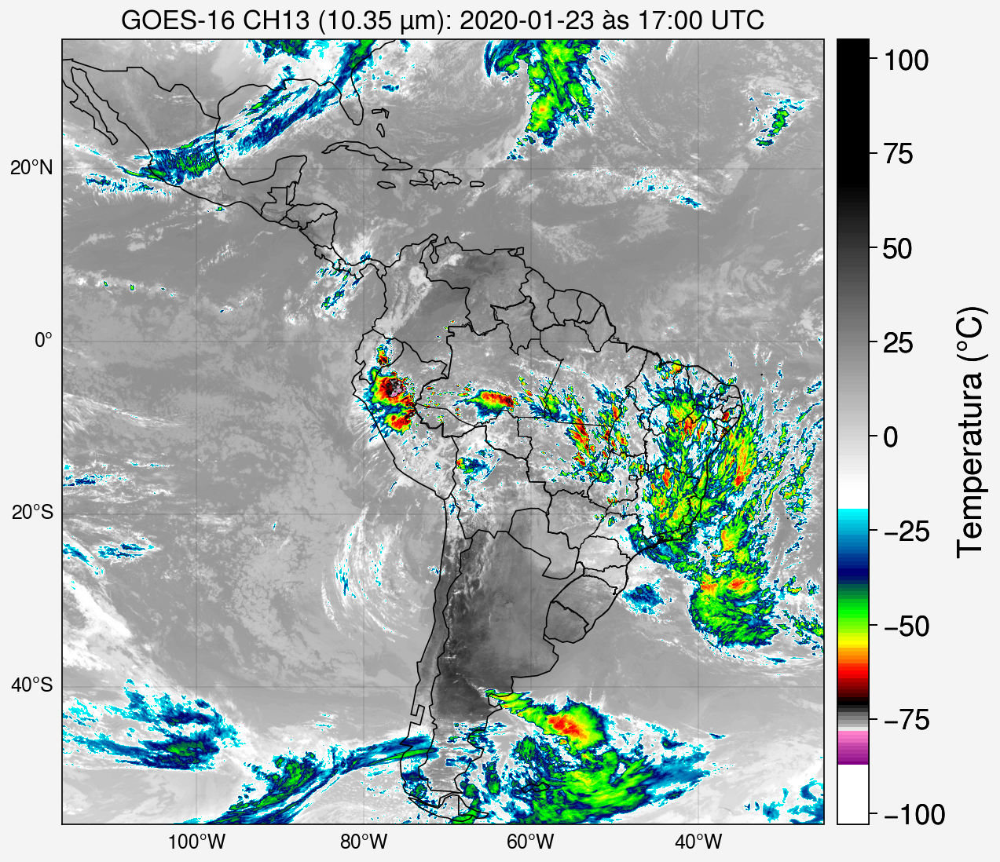

In [32]:
# cria moldura da figura
fig, ax = pplt.subplots(axwidth=5, axheight=5, tight=True, proj='pcarree')

# define formatação dos eixos da figura
ax.format(coast=True, borders=True, innerborders=False, labels=True, latlines=20, lonlines=20,
          latlim=(latmin,latmax), lonlim=(lonmin,lonmax), fontsize=11,
          title=f'GOES-16 CH13 (10.35 µm): {ano}-{mes}-{dia} às {hor}:{minu} UTC')

# carrega tabela de cores
cpt_ir = loadCPT(f'{dir}input/ir.cpt')
cmap_ir = cm.colors.LinearSegmentedColormap('cpt_ir', cpt_ir)

# plota mapa
map1 = ax.imshow(np.flipud(imagem),
                 cmap=cmap_ir,
                 extent=[lonmin, lonmax, latmin, latmax], levels=pplt.arange(-103.0, 105, 1.0))

# plota contornos dos Estados
estados_ibge.plot(edgecolor='black', facecolor='none', linewidth=0.4, alpha=0.8, ax=ax)

# plota barra de cores da figura
fig.colorbar(map1, loc='r', label='Temperatura ($\degree$C)', ticks=25, ticklabelsize=13, labelsize=15, space=0.1)

# salva figura
fig.save(f'goes16_ch13_{ano}{mes}{dia}_{hor}{minu}.jpg', dpi=300, bbox_inches='tight')

# exibe a figura na tela
pplt.show()

# **PARTE 2)**: Plota imagem do visível

- **Extrai informações importantes da imagem**

In [33]:
# leitura do arquivo
imagem = xr.open_dataset(f'/content/S10635334_{ano}{mes}{dia}{hor}{minu}.nc')

In [34]:
# mostra os dados
imagem

<xarray.Dataset>
Dimensions:  (lat: 6262, lon: 6262)
Coordinates:
  * lat      (lat) float64 -55.99 -55.98 -55.96 -55.95 ... 34.96 34.98 34.99
  * lon      (lon) float64 -116.0 -116.0 -116.0 -115.9 ... -25.04 -25.02 -25.01
Data variables:
    Band1    (lat, lon) float64 ...
    crs      |S1 ...
Attributes:
    Conventions:  CF-1.5
    GDAL:         GDAL 2.2.2, released 2017/09/15
    history:      Thu Jan 23 17:39:00 2020: GDAL Create( /dados/output/goes16...

In [35]:
# extrai os limites das latitudes e longitudes
latmin, latmax, lonmin, lonmax = float(imagem['lat'][0]), float(imagem['lat'][-1]), float(imagem['lon'][0]), float(imagem['lon'][-1])

In [36]:
# divide por 100
imagem = (imagem['Band1']/100.)

- **Plota imagem**

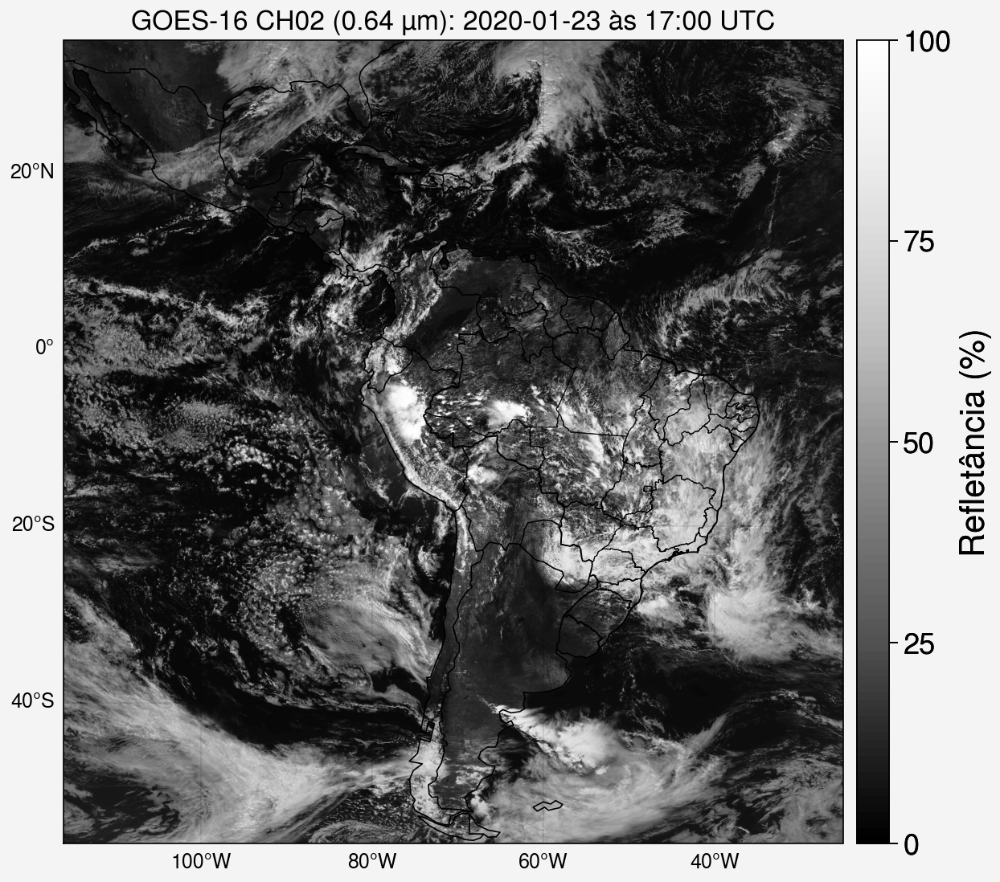

In [37]:
# cria modura da figura
fig, ax = pplt.subplots(axwidth=5, axheight=5, tight=True, proj='pcarree')

# define formatação dos eixos da figura
ax.format(coast=True, borders=True, innerborders=False, labels=True, latlines=20, lonlines=20,
          latlim=(latmin,latmax), lonlim=(lonmin,lonmax), fontsize=11,
          title=f'GOES-16 CH02 (0.64 µm): {ano}-{mes}-{dia} às {hor}:{minu} UTC')

# plota mapa
map1 = ax.imshow(np.flipud(imagem),
                 cmap='Greys_r',
                 extent=[lonmin, lonmax, latmin, latmax],
                 levels=pplt.arange(0, 100, 1.0))

# plota contornos dos Estados
estados_ibge.plot(edgecolor='black', facecolor='none', linewidth=0.4, alpha=0.8, ax=ax)

# plota barra de cores da figura
fig.colorbar(map1, loc='r', label='Refletância (%)', ticks=25, ticklabelsize=13, labelsize=15, space=0.1)

# salva figura
fig.save(f'goes16_ch02_{ano}{mes}{dia}_{hor}{minu}.jpg', dpi=300, bbox_inches='tight')

# exibe a figura na tela
pplt.show()

# **PARTE 3)**: Plota imagem do vapor d'água

- **Extrai informações importantes da imagem**

In [43]:
# leitura do arquivo
imagem = xr.open_dataset(f'/content/S10635340_{ano}{mes}{dia}{hor}{minu}.nc')

In [44]:
# mostra os dados
imagem

<xarray.Dataset>
Dimensions:  (lat: 3131, lon: 3131)
Coordinates:
  * lat      (lat) float64 -55.99 -55.96 -55.93 -55.9 ... 34.9 34.93 34.96 34.99
  * lon      (lon) float64 -116.0 -116.0 -115.9 -115.9 ... -25.07 -25.04 -25.01
Data variables:
    Band1    (lat, lon) float64 ...
    crs      |S1 ...
Attributes:
    Conventions:  CF-1.5
    GDAL:         GDAL 2.2.2, released 2017/09/15
    history:      Thu Jan 23 17:15:09 2020: GDAL Create( /dados/output/goes16...

In [45]:
# extrai os limites das latitudes e longitudes
latmin, latmax, lonmin, lonmax = float(imagem['lat'][0]), float(imagem['lat'][-1]), float(imagem['lon'][0]), float(imagem['lon'][-1])

In [46]:
# divide por 100 e transforma para Celsius
imagem = (imagem['Band1']/100.)-273.15

- **Plota imagem**

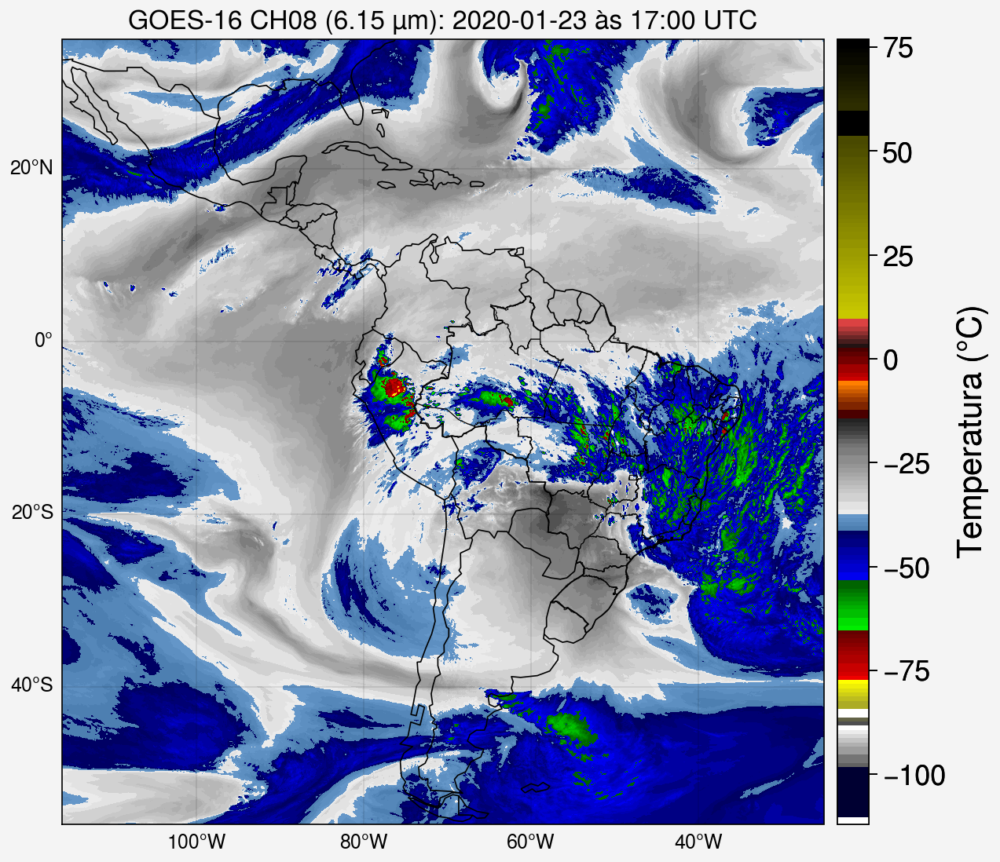

In [47]:
# cria moldura da figura
fig, ax = pplt.subplots(axwidth=5, axheight=5, tight=True, proj='pcarree')

# define formato da figura
ax.format(coast=True, borders=True, innerborders=False, labels=True, latlines=20, lonlines=20,
          latlim=(latmin,latmax), lonlim=(lonmin,lonmax), fontsize=11,
          title=f'GOES-16 CH08 (6.15 µm): {ano}-{mes}-{dia} às {hor}:{minu} UTC')

# carrega tabela de cores
cpt_wv = loadCPT(f'{dir}input/wv.cpt')
cmap_wv = cm.colors.LinearSegmentedColormap('cpt_wv', cpt_wv)

# plota mapa
map1 = ax.imshow(np.flipud(imagem),
                 cmap=cmap_wv,
                 extent=[lonmin, lonmax, latmin, latmax], levels=pplt.arange(-112.15, 77.00, 1.0))

# plota contornos dos Estados
estados_ibge.plot(edgecolor='black', facecolor='none', linewidth=0.4, alpha=0.8, ax=ax)

# plota barra de cores da figura
fig.colorbar(map1, loc='r', label='Temperatura ($\degree$C)', ticks=25, ticklabelsize=13, labelsize=15, space=0.1)

# salva figura
fig.save(f'goes16_ch08_{ano}{mes}{dia}_{hor}{minu}.jpg', dpi=300, bbox_inches='tight')

# exibe a figura na tela
pplt.show()

# **PARTE 4)**: Plota imagens em forma de painel
Nesta etapa plotaremos numa única figura a imagem do infravermelho, visível e vapor d'água.

- **Leitura dos dados**

In [51]:
imagem_ir = xr.open_dataset(f'/content/S10635346_{ano}{mes}{dia}{hor}{minu}.nc')
imagem_vis = xr.open_dataset(f'/content/S10635334_{ano}{mes}{dia}{hor}{minu}.nc')
imagem_wv = xr.open_dataset(f'/content/S10635340_{ano}{mes}{dia}{hor}{minu}.nc')

- **Organiza os dados**

In [52]:
imagem_ir = (imagem_ir['Band1']/100.)-273.15
imagem_vis = (imagem_vis['Band1']/100.)
imagem_wv = (imagem_wv['Band1']/100.)-273.15

- **Plota imagem**

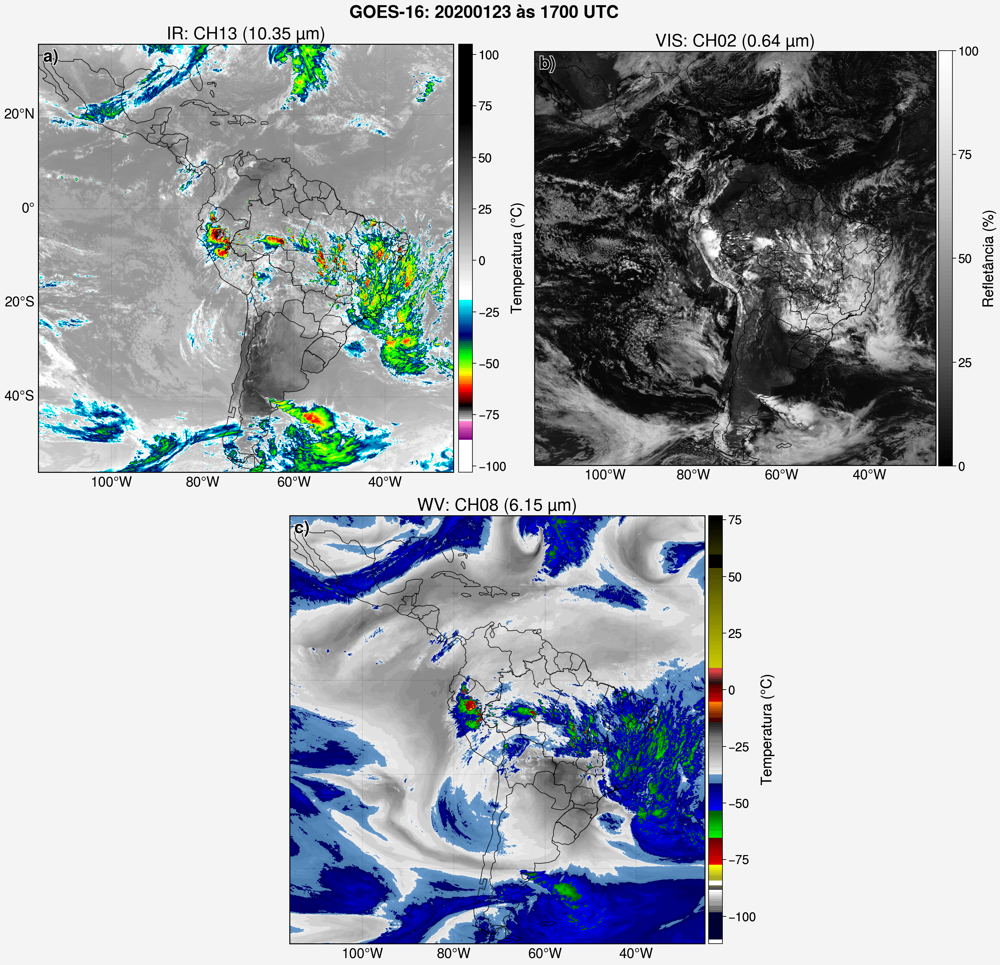

In [68]:
# cria a moldura da figura
fig, ax = pplt.subplots([[1, 1, 2, 2], [0, 3, 3, 0]], figsize=(14.5,14), tight=True, proj='pcarree', sharex= False, sharey = False)

# formatação dos eixos
ax.format(coast=True, borders=True, innerborders=False,
          labels=False,
          latlines=20, lonlines=20,
          latlim=(latmin,latmax), lonlim=(lonmin,lonmax),
          suptitle=f'GOES-16: {ano}{mes}{dia} às {hor}{minu} UTC',
          abc=True, abcstyle='a)', abcsize=5, abcloc = 'ul',
          small='20px', large='25px')

# define qual eixo terá os labels de latitudes e longitudes
ax[0].format(labels = [True, False, True, False])
ax[1].format(labels = [False, False, True, False])
ax[2].format(labels = [False, False, True, False])

#-------------------------------#
#       FIGURA 1: IR
#-------------------------------#
# carrega tabela de cores
cpt_ir = loadCPT(f'{dir}input/ir.cpt')
cmap_ir = cm.colors.LinearSegmentedColormap('cpt_ir', cpt_ir)

# plota mapa
map1 =  ax[0].imshow(np.flipud(imagem_ir),
                    cmap=cmap_ir,
                    extent=[lonmin, lonmax, latmin, latmax],
                    levels=pplt.arange(-103.0, 105, 1.0))

# plota contornos dos Estados
estados_ibge.plot(edgecolor='black', facecolor='none', linewidth=0.4, alpha=0.8, ax=ax[0])

# plota titulo de cada figura
ax[0].format(title='IR: CH13 (10.35 µm)', labels=True, linewidth=1)

# plota barra de cores da figura
ax[0].colorbar(map1, loc='r', label='Temperatura ($\degree$C)', ticks=25, ticklabelsize=13, labelsize=15, space=-0.1)

#-------------------------------#
#        FIGURA 2: VIS
#-------------------------------#
# plota mapa
map2 = ax[1].imshow(np.flipud(imagem_vis),
             cmap='Greys_r',
             extent=[lonmin, lonmax, latmin, latmax],
             levels=pplt.arange(0, 100, 1.0))

# plota contornos dos Estados
estados_ibge.plot(edgecolor='black', facecolor='none', linewidth=0.4, alpha=0.8, ax=ax[1])

# plota titulo de cada figura
ax[1].format(title='VIS: CH02 (0.64 µm)', labels=True, linewidth=1)

# plota barra de cores da figura
ax[1].colorbar(map2, loc='r', label='Refletância (%)', ticks=25, ticklabelsize=13, labelsize=15, space=0.3, length=0.97)

#-------------------------------#
#         FIGURA 3: WV
#-------------------------------#
# Carrega tabela de cores
cpt_wv = loadCPT(f'{dir}input/wv.cpt')
cmap_wv = cm.colors.LinearSegmentedColormap('cpt_wv', cpt_wv)

# plota mapa
map3 = ax[2].imshow(np.flipud(imagem_wv),
             cmap=cmap_wv,
             extent=[lonmin, lonmax, latmin, latmax],
             levels=pplt.arange(-112.15, 77.00, 1.0))

# plota contornos dos Estados
estados_ibge.plot(edgecolor='black', facecolor='none', linewidth=0.4, alpha=0.8, ax=ax[2])

# plota titulo de cada figura
ax[2].format(title="WV: CH08 (6.15 µm)", labels=True, linewidth=1)

# plota barra de cores da figura
ax[2].colorbar(map3, loc='r', label='Temperatura ($\degree$C)', ticks=25, ticklabelsize=13, labelsize=15, space=-4.6)
#-------------------------------#

# salva figura
fig.savefig(f'painel_IR_VIS_WV.png', dpi=300)

# exibe a figura na tela
pplt.show()